# <center> Exploration of the COVID-19 Pandemic  - Final Project Notebook </center>
### <center><u>Data 100 (Principles & Techniques of Data Science - Spring 2020)</u></center>
#### <center> Instructors: Joseph Gonzalez & Ani Adhikari </center>
######  Priyans Nishithkumar Desai (priyansdesai@berkeley.edu)
######                 Rohit Deshpande (rohitdeshpande@berkeley.edu)
######                Anuja Lohia (anujalohia@berkeley.edu)


In [177]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from csv import DictReader
import sys
from matplotlib.patches import Polygon
from difflib import SequenceMatcher
from IPython.display import display, Markdown, Latex
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import ensemble
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.feature_extraction import DictVectorizer
import warnings
warnings.filterwarnings('ignore')
from IPython.display import Image
!pip install folium
#!pip install basemap

In [101]:
#Utilities
def ohe_fireplace_qu(data, columns):
    """
    One-hot-encodes fireplace quality.  New columns are of the form Fireplace_Qu=QUALITY
    """
    for column in columns:
        vec_enc = DictVectorizer()
        vec_enc.fit(data[[column]].to_dict(orient='records'))
        fireplace_qu_data = vec_enc.transform(data[[column]].to_dict(orient='records')).toarray()
        fireplace_qu_cats = vec_enc.get_feature_names()
        fireplace_qu = pd.DataFrame(fireplace_qu_data, columns=fireplace_qu_cats)
        data = pd.concat([data, fireplace_qu], axis=1)
        data = data.drop(columns=fireplace_qu_cats[0])
    return data
def rmse(y, yhat):
    return np.sqrt(np.mean((y - yhat)**2))
def rmse_score(model, X, y):
    return np.sqrt(np.mean((y - model.predict(X))**2))

# Predicting Deaths in Regions with More At-Risk Populations

## Background
The Coronavirus pandemic is taking the world by storm, but its a time period during which many take to finding important patterns, trends, and any predictions that can help solve this problem. The coronavirus has proved to be among the most infectious diseases, but how does it do in terms of deaths? One of the major results we are seeing is that regions with higher amounts of underlying health conditions are experiencing more deaths and that's what we intend to explore further.

## The Data Cleaning and Preparing Process
We make use of 4 datasets across the entire modeling process. Each of these dataframes by themselves already have more information than what we need, so we will only keep the relevant parts and also add a few needed calculations. 


In [102]:
mortality = pd.read_csv("abridged_couties.csv")
all_hosps = mortality.groupby("State").agg('sum')['#Hospitals']
all_icu_beds = mortality.groupby("State").agg('sum')['#ICU_beds']
mortality.head()

,countyFIPS,STATEFP,COUNTYFP,CountyName,StateName,State,lat,lon,POP_LATITUDE,POP_LONGITUDE,...,>500 gatherings,public schools,restaurant dine-in,entertainment/gym,federal guidelines,foreign travel ban,SVIPercentile,HPSAShortage,HPSAServedPop,HPSAUnderservedPop
0,01001,1.0,1.0,Autauga,AL,Alabama,32.540091,-86.645649,32.500389,-86.494165,...,737497.0,737500.0,737503.0,737512.0,737500.0,737495.0,0.4354,NaN,NaN,NaN
1,01003,1.0,3.0,Baldwin,AL,Alabama,30.738314,-87.726272,30.548923,-87.762381,...,737497.0,737500.0,737503.0,737512.0,737500.0,737495.0,0.2162,NaN,NaN,NaN
2,01005,1.0,5.0,Barbour,AL,Alabama,31.874030,-85.397327,31.844036,-85.310038,...,737497.0,737500.0,737503.0,737512.0,737500.0,737495.0,0.9959,6.08,5400.0,18241.0
3,01007,1.0,7.0,Bibb,AL,Alabama,32.999024,-87.125260,33.030921,-87.127659,...,737497.0,737500.0,737503.0,737512.0,737500.0,737495.0,0.6003,2.75,14980.0,6120.0
4,01009,1.0,9.0,Blount,AL,Alabama,33.990440,-86.562711,33.955243,-86.591491,...,737497.0,737500.0,737503.0,737512.0,737500.0,737495.0,0.4242,7.21,31850.0,25233.0


We are only keeping the parts of the Mortality table which we will use in our modeling process, and the rest are just extra columns, and so naturally we only keep the population estimates, and all the mortality rates associated with common illnesses. This will be used to represent the many underlying conditions that potentially exist in various counties.

In [103]:
mortality.head()
pop = mortality[["CountyName","State","PopulationEstimate2018"]]

In [104]:
mortality = mortality[["CountyName","State","HeartDiseaseMortality",'DiabetesPercentage',"StrokeMortality","RespMortalityRate2014","Smokers_Percentage", "dem_to_rep_ratio"]]
mortality.head()


,CountyName,State,HeartDiseaseMortality,DiabetesPercentage,StrokeMortality,RespMortalityRate2014,Smokers_Percentage,dem_to_rep_ratio
0,Autauga,Alabama,204.5,9.9,56.1,81.79,18.081557,0.326656
1,Baldwin,Alabama,183.2,8.5,41.9,54.28,17.489033,0.253255
2,Barbour,Alabama,220.4,15.7,49.0,69.82,21.999985,0.893106
3,Bibb,Alabama,225.5,13.3,57.2,84.49,19.114200,0.278124
4,Blount,Alabama,224.8,14.9,52.8,87.05,19.208672,0.094317


We decided it was best to drop the states that did not have data for our above chosen features as this is what our prediction will be based on.

In [105]:
mortality = mortality.dropna()
mortality = mortality.groupby("State").mean()

mortality['#Hospitals'] = all_hosps
mortality['#ICU_beds'] = all_icu_beds
mortality.head()

,HeartDiseaseMortality,DiabetesPercentage,StrokeMortality,RespMortalityRate2014,Smokers_Percentage,dem_to_rep_ratio,#Hospitals,#ICU_beds
State,,,,,,,,
Alabama,243.595522,14.407463,51.450746,77.282985,19.989231,0.805885,86.0,1533.0
Arizona,148.826667,10.060000,30.900000,51.968667,16.483911,0.974740,76.0,1559.0
Arkansas,235.172000,13.432000,47.681333,72.727067,20.388849,0.521649,74.0,732.0
California,153.908621,8.505172,37.891379,52.153621,12.091600,1.641729,329.0,7338.0
Colorado,130.337500,6.150000,32.851562,61.043125,14.297498,0.870425,80.0,1095.0


In [106]:
cases = pd.read_csv("4.18states.csv")

Another one of the datasets we will breakdown is the table that gives us information specific to the coronavirus at the state level.

In [107]:
cases = cases[["Province_State","Country_Region","Confirmed","Deaths","Mortality_Rate", "Testing_Rate", "Hospitalization_Rate","Recovered"]]
cases = cases[cases["Country_Region"] == "US"]

For this dataframe, since removing the ones with missing values would adversely affect the number of rows in the dataset, and all the values are numerical, we decided to replace missing values with zero.

In [108]:
cases = cases.fillna(0)
cases.shape

(59, 8)

In [109]:
merged = cases.merge(mortality,left_on ="Province_State" ,right_on ="State" )

In [110]:
grouped_pop = pop.groupby("State").sum().sort_values("PopulationEstimate2018")

In [111]:
data = merged.merge(grouped_pop,left_on ="Province_State" ,right_on ="State" )


In [112]:
data.head()

,Province_State,Country_Region,Confirmed,Deaths,Mortality_Rate,Testing_Rate,Hospitalization_Rate,Recovered,HeartDiseaseMortality,DiabetesPercentage,StrokeMortality,RespMortalityRate2014,Smokers_Percentage,dem_to_rep_ratio,#Hospitals,#ICU_beds,PopulationEstimate2018
0,Alabama,US,4712,153,3.247029,907.206961,13.157895,0.0,243.595522,14.407463,51.450746,77.282985,19.989231,0.805885,86.0,1533.0,4887871.0
1,Arizona,US,4724,180,3.810330,701.291175,11.981372,539.0,148.826667,10.060000,30.900000,51.968667,16.483911,0.974740,76.0,1559.0,7171646.0
2,Arkansas,US,1744,38,2.178899,932.435235,16.685780,703.0,235.172000,13.432000,47.681333,72.727067,20.388849,0.521649,74.0,732.0,3013825.0
3,California,US,30491,1140,3.738808,641.731334,16.044079,0.0,153.908621,8.505172,37.891379,52.153621,12.091600,1.641729,329.0,7338.0,39557045.0
4,Colorado,US,9047,389,4.299768,764.221442,19.398696,0.0,130.337500,6.150000,32.851562,61.043125,14.297498,0.870425,80.0,1095.0,5695564.0


Now that we have a single merged dataset for all values, below we can see a correlation between the number of confirmed cases and number of confirmed deaths in each county. The near linear relationship implies using the confirmed cases to predict deaths will be a good idea.


Text(0.5, 1.0, 'Relation between confirmed cases and deaths')

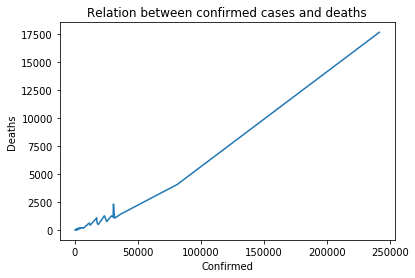

In [113]:
sns.lineplot(data["Confirmed"],data["Deaths"])
plt.title("Relation between confirmed cases and deaths")

Another factor to explore was if there was any political motivation behind any of these trends that developed, and that's what we explored. First we created a KDE density plot to see if there was a potential relation between the testing rate and the hospitalization rate. The graph showed a solid concentration of testing and hospitalization rate over a certain range of values. 

Moving into more politically motivated findings, we looked at the democratic to republican ratio and compared it to the number of hospitals present per state. We see a correlation between relatively lower democratic to republican ratio and a lower amount of hospitals present. 


Text(0.5, 1.0, 'Looking for Outliers')

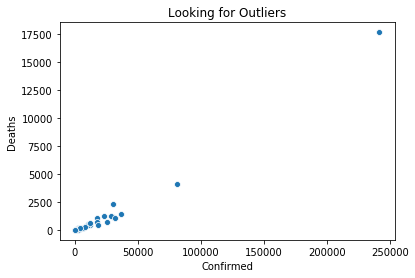

In [114]:
sns.scatterplot(data["Confirmed"],data["Deaths"])
plt.title("Looking for Outliers")

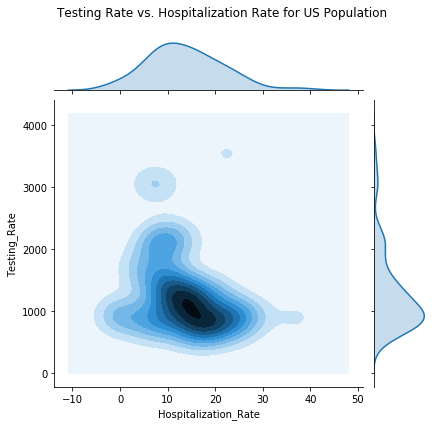

In [115]:
jointitle = sns.jointplot(
    data=data, 
    x='Hospitalization_Rate', 
    y='Testing_Rate',
   kind = 'kde'
    );
plt.subplots_adjust(top=.90)
title3 = jointitle.fig.suptitle('Testing Rate vs. Hospitalization Rate for US Population')

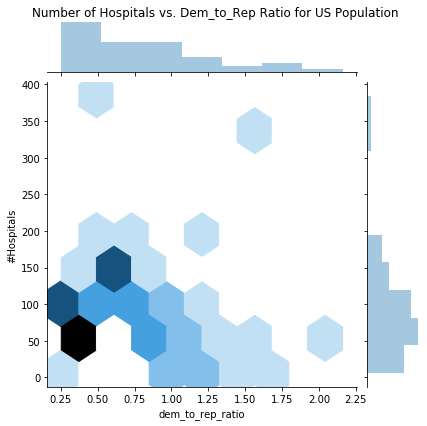

In [116]:
jointtitle = sns.jointplot(
    data=data, 
    x='dem_to_rep_ratio', 
    y='#Hospitals',
   kind = 'hex'
    );
plt.subplots_adjust(top=.95)
title2 = jointtitle.fig.suptitle('Number of Hospitals vs. Dem_to_Rep Ratio for US Population')

The Map below shows the political skew of each county in each of the 48 contiguous states. We can use this a
                  bit later when drawing comparisons and exploring which 
                  counties and states had a higher death rate. We did this
                  by also accounting for the underlying health conditions 
                  which we will see below. The code below has currently been commented out as running it requires libraries that cannot be loaded into Jupyter but has to be installed locally on your system. So for all the code below, I have converted it into a giant string and assigned it to a dummy variable so that the whole string does not display as a long text.

In [117]:
a = '''
def draw_us_map():
    # Set the lower left and upper right limits of the bounding box:
    lllon = -119
    urlon = -64
    lllat = 22.0
    urlat = 50.5
    # and calculate a centerpoint, needed for the projection:
    centerlon = float(lllon + urlon) / 2.0
    centerlat = float(lllat + urlat) / 2.0

    m = Basemap(resolution='i',  # crude, low, intermediate, high, full
                llcrnrlon = lllon, urcrnrlon = urlon,
                lon_0 = centerlon,
                llcrnrlat = lllat, urcrnrlat = urlat,
                lat_0 = centerlat,
                projection='tmerc')

    # Read state boundaries.
    shp_info = m.readshapefile('st99_d00', 'states',
                               drawbounds=True, color='lightgrey')

    # Read county boundaries
    shp_info = m.readshapefile('cb_2015_us_county_500k',
                               'counties',
                               drawbounds=True)
    maxstatefp = 0
    states = [None] * 75
    for state in m.states_info:
        statefp = int(state["STATE"])
        # print statefp, state["NAME"]
        if statefp > maxstatefp:
            maxstatefp = statefp
        # Many states have multiple entries in m.states (because of islands?).
        # Only need to add it once.
        if not states[statefp]:
            states[statefp] = state["NAME"]
    return m, states

def map_county_data(m, states):
    fp = open("tidy_data.csv")
    reader = DictReader(fp)

    ax = plt.gca()     # get current axes instance

    # Make a dictionary of all counties and their colors.
    county_colors = {}
    i = 0
    for county in reader:
        if i == 3114:
            break
        # What color is this county?

        # Alaska has no results at all:
        if not county["votes16_clintonh"] or not county["votes16_trumpd"]:
            #print("No results for", cname)
            continue

        # print "keys:", county.keys()
        # The dataset holds at least one blank county in Alaska ...
        # which nevertheless has lots of demographic stats,
        # though no election results.
        if not county["name_16"]:
            # Alaska counties are all missing their county name,
            # but we might be able to get it from the longer County field.
            cname = county["County"][:-8]
            if cname.endswith(" Census Area"):
                cname = cname[:-12]
            elif cname.endswith(" City and Borough"):
                cname = cname[:-17]
            elif cname.endswith(" Borough"):
                cname = cname[:-8]
            else:
                #print("Not sure what", cname, "ends with")
                continue
            #print("County name was blank, using", cname)
        else:
            cname = county["name_16"]

        # What color is this county?
        # print "keys:", county.keys()
        # print county
        dem = float(county["votes16_clintonh"])
        rep = float(county["votes16_trumpd"])
        # pop = float(county["Total.Population"])
        pop = float(county["votes"])
        # print county["name"], ":", dem, rep, pop, county["votes"]
        blue = dem/pop
        red = rep/pop

        # In the Deleetdk data, some counties end with "County" inappropriately.
        # Remove it, if so.
        if cname.lower().endswith(" county"):
            #print("Stripping -county", cname)
            cname = cname[:-7]
        county_colors["%s, %s" % (cname, county["State"])] \
            = (red, 0, blue)
        i+=1

    fp.close()

    # Now loop through all counties on the map, coloring them appropriately.
    for i, county in enumerate(m.counties_info):
        countyname = county["NAME"]
        try:
            statename = states[int(county["STATEFP"])]
        except IndexError:
            #print(countyname, "has out-of-index statefp of", county["STATEFP"])
            continue

        # The file has no results for Puerto Rico and Alaska.
        if statename == "Puerto Rico" or statename == "Alaska":
            continue

        if not statename:
            #print("No state for", countyname)
            continue

        countystate = "%s, %s" % (countyname, statename)

        try:
            ccolor = county_colors[countystate]
        except KeyError:
            # No exact match. Try for a fuzzy match.
            # Some counties in the Deleetdk are capitalized,
            # lack spaces between words, lack tildes or similar.
            fuzzyname = fuzzy_find(countystate, county_colors.keys())
            if fuzzyname:
                #print("Got a fuzzy match,", countystate, "=", fuzzyname)
                ccolor = county_colors[fuzzyname]
                county_colors[countystate] = ccolor
            else:
                #print("No match for", countystate)
                continue
        countyseg = m.counties[i]

        # Move Hawaii and Alaska:
        # http://stackoverflow.com/questions/39742305/how-to-use-basemap-python-to-plot-us-with-50-states
        # Offset Alaska and Hawaii to the lower-left corner.
        ''''''

        poly = Polygon(countyseg, facecolor=ccolor)  # edgecolor="white"
        ax.add_patch(poly)

def fuzzy_find(s, slist):
    Try to find a fuzzy match for s in slist.
    
    best_ratio = -1
    best_match = None

    ls = s.lower()
    for ss in slist:
        r = SequenceMatcher(None, ls, ss.lower()).ratio()
        if r > best_ratio:
            best_ratio = r
            best_match = ss
    if best_ratio > .75:
        return best_match
    return None
def init_map():
    plt.figure(figsize=(200,200))
    m, states = draw_us_map()
    return m, states
display(Markdown('The Map below shows the political skew of each county\
                  in each of the 48 contiguous states. We can use this a\
                  bit later when drawing comparisons and exploring which \
                  counties and states had a higher death rate. We did this\
                  by also accounting for the underlying health conditions\
                  which we will see below.'))
def show_map():
    plt.tight_layout(pad=0, w_pad=0, h_pad=0)

    plt.title('US Map')
    plt.show()

if __name__ == "__main__":
    m, states = init_map()

    map_county_data(m, states)

    show_map()

'''    

If we were to run the cell above with all the properly installed libraries, we would get the map presented below. Again, this shows the political inclination of each county with red being the most republican and blue being the most democratic. 

In [118]:
Image(filename='download.png') 

# States Model
Now we want to model on the state level and see if we can clean the data a little bit more before building our model. We will also perform a train/test split and build our model on the training data. Since we are using numerical values such as Hospitalization rates, other illness rates, and we are trying to predict another numerical value a Linear Regression model was most appropriate, and here we used all of the previously mentioned health related features to predict the deaths.

But there are two different models we made to try out. The first model includes all the states and the second model discludes New York. But why would we even consider discluding New York? If we look at the testing rate and confirmed cases in the scatter plot below, there are potentially a few outliers but one data point is clearly an extreme in both dimensions, New York. This could adversely affect our model, or not, which is why 2 models were made to see which provides a better accuracy.

Text(0.5, 1.0, 'Relationship between Testing rate for Covid and Confirmed Cases')

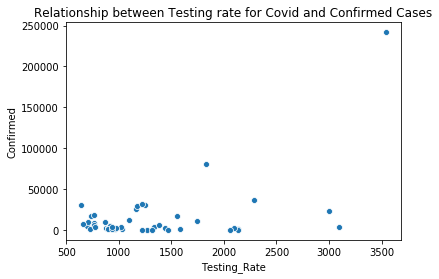

In [119]:
sns.scatterplot(data["Testing_Rate"],data["Confirmed"])
plt.title("Relationship between Testing rate for Covid and Confirmed Cases")

We chose to normalize our data for the states model because a lot of the data was grouped and aggregated from the counties data and the size of the dataset was small as well so we thought it would gain more structure through normalization.

In [120]:
data_withoutNY = data[data["Province_State"]!= "New York"]
data = data[['Confirmed', 'Deaths',
        'Testing_Rate', 'Hospitalization_Rate', 
       'Recovered', 'HeartDiseaseMortality', 'StrokeMortality', 
       'RespMortalityRate2014', 'Smokers_Percentage', '#Hospitals','dem_to_rep_ratio',
       '#ICU_beds', 'PopulationEstimate2018',"DiabetesPercentage"]]
data_withoutNY = data_withoutNY[['Confirmed', 'Deaths',
        'Testing_Rate', 'Hospitalization_Rate', 
       'Recovered', 'HeartDiseaseMortality', 'StrokeMortality', 
       'RespMortalityRate2014', 'Smokers_Percentage', '#Hospitals','dem_to_rep_ratio',
       '#ICU_beds', 'PopulationEstimate2018',"DiabetesPercentage"]]
data = (data - data.mean())/data.std()
data_withoutNY = (data_withoutNY - data_withoutNY.mean())/data_withoutNY.mean()
train, test = train_test_split(data, test_size=0.3, random_state=10)

In [121]:
model = LinearRegression()
X_train = train[['Confirmed',
        'Testing_Rate', 'Hospitalization_Rate', 
       'Recovered', 'HeartDiseaseMortality', 'StrokeMortality', 
       'RespMortalityRate2014', 'Smokers_Percentage', '#Hospitals','dem_to_rep_ratio',
       '#ICU_beds', 'PopulationEstimate2018',"DiabetesPercentage"]]
Y_train = train["Deaths"]
X_test = test[['Confirmed',
        'Testing_Rate', 'Hospitalization_Rate', 
       'Recovered', 'HeartDiseaseMortality', 'StrokeMortality', 
       'RespMortalityRate2014', 'Smokers_Percentage', '#Hospitals','dem_to_rep_ratio',
       '#ICU_beds', 'PopulationEstimate2018',"DiabetesPercentage"]]
Y_test = test["Deaths"]
model.fit(X_train,Y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

After building the model, we ran 5-fold cross validation to find the error across multiple splits of the data to ensure that the average error across all splits were reasonably low. Most of our models did alright with thr exception of one, but we'll review all the results later.

In [122]:
cross_valid = cross_val_score(model, X_train, Y_train, cv = 5, scoring = rmse_score)
cross_valid


array([0.2250595 , 0.12933754, 0.1411592 , 0.52804629, 0.07708719])

In [123]:
states_cv_rmse = np.mean(cross_valid)
states_cv_rmse

0.22013794459598426

In [124]:
Y_hat = model.predict(X_test)


In [125]:
train_rmse = rmse(Y_train, model.predict(X_train))
test_rmse = rmse(Y_test, Y_hat)
print("Training Data RMSE: ", train_rmse)
print("Testingg Data RMSE: ", test_rmse)


Training Data RMSE:  0.062426426638958935
Testingg Data RMSE:  0.12209263657237102


At the end of the model we build for including New York, we had a train Root mean squared error (RMSE) of 0.06 and a test RMSE of .12, which is fairly reasonable.

# Model without NY
The second model we build will not include New York as a part of our data. Now we will explore whether this is better than the original model that included New York.

In [126]:

tr, te = train_test_split(data_withoutNY, test_size=0.3, random_state=83)
model_no_NY = LinearRegression()
X_tr = tr[['Confirmed',
        'Testing_Rate', 'Hospitalization_Rate', 
       'Recovered', 'HeartDiseaseMortality', 'StrokeMortality', 
       'RespMortalityRate2014', 'Smokers_Percentage', '#Hospitals','dem_to_rep_ratio',
       '#ICU_beds', 'PopulationEstimate2018',"DiabetesPercentage"]]
Y_tr = tr["Deaths"]
X_te = te[['Confirmed',
        'Testing_Rate', 'Hospitalization_Rate', 
       'Recovered', 'HeartDiseaseMortality', 'StrokeMortality', 
       'RespMortalityRate2014', 'Smokers_Percentage', '#Hospitals','dem_to_rep_ratio',
       '#ICU_beds', 'PopulationEstimate2018',"DiabetesPercentage"]]
Y_te = te["Deaths"]
model_no_NY.fit(X_tr,Y_tr)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [127]:
Y_hat1 = model_no_NY.predict(X_te)
test_rmse1 = rmse(Y_te, Y_hat1)
train_rmse1 = rmse(Y_tr, model_no_NY.predict(X_tr))
print("Training Data RMSE: ", train_rmse1)
print("Testingg Data RMSE: ", test_rmse1)


Training Data RMSE:  0.3770881942658502
Testingg Data RMSE:  0.38588383168286766


Without question, our model built for including New York as a feature was significantly better, so that model will remain intact and the above model was just as an experiment to see if removing it would improve our model since it was an outlier, but surprisingly it wasn't. 

# Counties Model
Our last model build involves the the same type of prediction, except on a smaller scale with counties rather than states. 

In [128]:
time_deaths = pd.read_csv("time_series_covid19_deaths_US.csv")
time_confirmed = pd.read_csv("time_series_covid19_confirmed_US.csv")
time_deaths.shape


(3255, 100)

We drop the NaNs in the deaths table as that is what we want to predict and the confirmed table as that is one of the essential features in our model. Since deaths and confirmed cases are cumulative in these tables, we choose the last column of each - 4/18/20.

In [129]:
time_deaths = time_deaths.dropna()
time_confirmed = time_confirmed.dropna()

In [130]:
time_deaths = time_deaths[time_deaths["Admin2"]!="Unassigned"]
time_confirmed = time_confirmed[time_confirmed["Admin2"]!="Unassigned"]

In [131]:
deaths = time_deaths[["Admin2","Province_State","4/18/20"]]
confirmed = time_confirmed[["Admin2","Province_State","4/18/20"]]
confirmed = confirmed.rename(columns = {'4/18/20':"Confirmed"})


Now many of the columns in the below table refer to dates we need to make use of. The issue is that these are in Gregorian Ordinal time format which, in simpler words, counts the time since January 1st, 1. This information isn't useful in the format we currently have it, so the cell below does two things:

1. We convert the Gregorian Ordinal time into a present day date.
2. We find the difference in number of days between the date in the column and April 18th, the day we chose to count the deaths for our modeling.

In [132]:
mortality_new = pd.read_csv("abridged_couties.csv")
columns_to_change = ['stay at home', '>50 gatherings', '>500 gatherings', 'public schools',\
                     'restaurant dine-in', 'entertainment/gym', 'federal guidelines',\
                     'foreign travel ban']
for j in columns_to_change:
    mortality_new = mortality_new.dropna(subset = [j])
    mortality_new[j] = [pd.Timestamp.fromordinal(int(i))\
                                               for i in mortality_new[j]]
    mortality_new[j] = (pd.Timestamp('2020-04-18T00') - \
                                              mortality_new[j]).dt.days
mortality_new.head()

,countyFIPS,STATEFP,COUNTYFP,CountyName,StateName,State,lat,lon,POP_LATITUDE,POP_LONGITUDE,...,>500 gatherings,public schools,restaurant dine-in,entertainment/gym,federal guidelines,foreign travel ban,SVIPercentile,HPSAShortage,HPSAServedPop,HPSAUnderservedPop
0,01001,1.0,1.0,Autauga,AL,Alabama,32.540091,-86.645649,32.500389,-86.494165,...,36,33,30,21,33,38,0.4354,NaN,NaN,NaN
1,01003,1.0,3.0,Baldwin,AL,Alabama,30.738314,-87.726272,30.548923,-87.762381,...,36,33,30,21,33,38,0.2162,NaN,NaN,NaN
2,01005,1.0,5.0,Barbour,AL,Alabama,31.874030,-85.397327,31.844036,-85.310038,...,36,33,30,21,33,38,0.9959,6.08,5400.0,18241.0
3,01007,1.0,7.0,Bibb,AL,Alabama,32.999024,-87.125260,33.030921,-87.127659,...,36,33,30,21,33,38,0.6003,2.75,14980.0,6120.0
4,01009,1.0,9.0,Blount,AL,Alabama,33.990440,-86.562711,33.955243,-86.591491,...,36,33,30,21,33,38,0.4242,7.21,31850.0,25233.0


From the plethora of columns above to choose from, we selected the disease prevalence and mortalities as well as some other interesting features such as >500 gatherings. It was interesting that a few places that introduced lockdown measures earlier than others still had higher number of deaths as seen below:

In [133]:
county_mortality = mortality_new[["CountyName","State","HeartDiseaseMortality","StrokeMortality","RespMortalityRate2014","Smokers_Percentage", "#Hospitals", "HPSAShortage", ">500 gatherings",'DiabetesPercentage','PopulationDensityperSqMile2010']]
merged_counties = deaths.merge(county_mortality,right_on= ["CountyName","State"],left_on = ["Admin2","Province_State"])
merged_counties = confirmed.merge(merged_counties,right_on= ["CountyName","State"],left_on = ["Admin2","Province_State"])

In [134]:
merged_counties = merged_counties.dropna()
merged_counties = merged_counties.drop(['Admin2_x','Province_State_x','Admin2_y','Province_State_y'],axis = 1)

In [135]:
merged_counties = merged_counties.merge(pop,left_on = ['CountyName','State'],right_on =['CountyName','State'] )
merged_counties.head()


,Confirmed,4/18/20,CountyName,State,HeartDiseaseMortality,StrokeMortality,RespMortalityRate2014,Smokers_Percentage,#Hospitals,HPSAShortage,>500 gatherings,DiabetesPercentage,PopulationDensityperSqMile2010,PopulationEstimate2018
0,18,0,Barbour,Alabama,220.4,49.0,69.82,21.999985,1.0,6.08,36,15.7,31.0,24881.0
1,26,0,Bibb,Alabama,225.5,57.2,84.49,19.114200,1.0,2.75,36,13.3,36.8,22400.0
2,20,0,Blount,Alabama,224.8,52.8,87.05,19.208672,1.0,7.21,36,14.9,88.9,57840.0
3,9,0,Bullock,Alabama,214.3,54.1,51.49,22.894664,1.0,2.38,36,22.4,17.5,10138.0
4,13,0,Butler,Alabama,259.5,59.0,75.09,21.765335,1.0,1.31,36,16.9,27.0,19680.0


Text(0.5, 1.0, 'Relationship between when social distancing measures were implemented and no. of deaths')

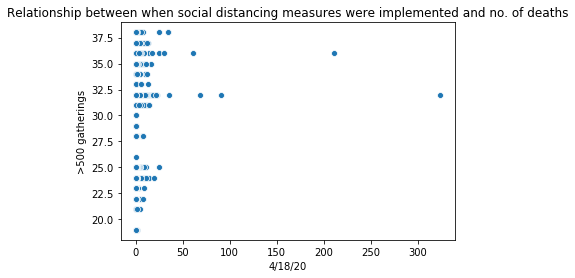

In [136]:
sns.scatterplot(
    data=merged_counties, 
    x='4/18/20', 
    y='>500 gatherings',
)
plt.title("Relationship between when social distancing measures were implemented and no. of deaths")

Text(0, 0.5, 'Proportion of Counties')

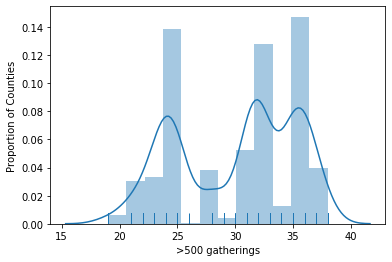

In [137]:
sns.distplot(
    merged_counties['>500 gatherings'],
    rug= True
)
plt.ylabel("Proportion of Counties")

Another thing we noticed was a lot of places were concentrated around the 10% diabetes percetage mark and the 15-20% smokers_percetage mark.

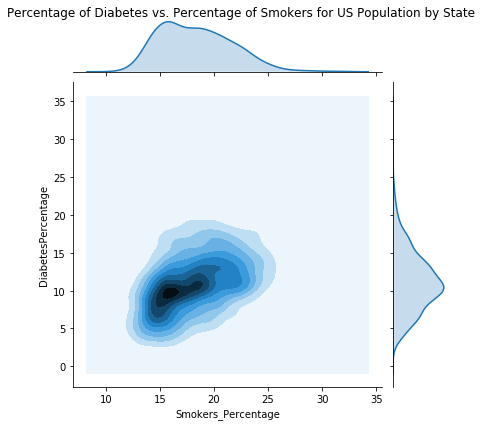

In [138]:
jointtitle2 = sns.jointplot(
    data=merged_counties, 
    x='Smokers_Percentage', 
    y='DiabetesPercentage',
    kind = 'kde'
)
plt.subplots_adjust(top=.95)
title4 = jointtitle2.fig.suptitle('Percentage of Diabetes vs. Percentage of Smokers for US Population by State')

The cell below creates a model with similar features as the states model with a few additional features that come into play when we use the counties data.

In [139]:
model2 = LinearRegression()
merged_counties = merged_counties[['Confirmed', '4/18/20', 'HeartDiseaseMortality',
       'StrokeMortality', 'RespMortalityRate2014', 'Smokers_Percentage','DiabetesPercentage',
       '#Hospitals',  'HPSAShortage','PopulationDensityperSqMile2010',
       'PopulationEstimate2018',">500 gatherings"]]

train2, test2 = train_test_split(merged_counties, test_size=0.2, random_state=28)
X_train2 = train2[["HeartDiseaseMortality","StrokeMortality","PopulationEstimate2018",'DiabetesPercentage',"RespMortalityRate2014","Smokers_Percentage","Confirmed", "#Hospitals", "HPSAShortage",'PopulationDensityperSqMile2010','>500 gatherings']]
Y_train2 = train2["4/18/20"]
X_test2 = test2[["HeartDiseaseMortality","StrokeMortality","PopulationEstimate2018",'DiabetesPercentage',"RespMortalityRate2014","Smokers_Percentage","Confirmed", "#Hospitals", "HPSAShortage",'PopulationDensityperSqMile2010','>500 gatherings']]
Y_test2 = test2["4/18/20"]
model2.fit(X_train2,Y_train2)


LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [140]:
cross_val_rmse = cross_val_score(model2, X_train2, Y_train2,cv =5,scoring = rmse_score)
cross_val_rmse

array([3.11228222, 1.66843659, 2.85489026, 8.92099163, 7.7769673 ])

In [141]:
mean_cv_rmse = np.mean(cross_val_rmse)
print("Mean Cross Validation RMSE: ", mean_cv_rmse)


Mean Cross Validation RMSE:  4.866713600173516


In [142]:
test_rmse_county = rmse(Y_test2, model2.predict(X_test2))
test_rmse_county
print("Test RMSE for Counties: ", test_rmse_county)


Test RMSE for Counties:  1.5961140812482488


In [143]:
train_rmse_county = rmse(Y_train2, model2.predict(X_train2))
train_rmse_county
print("Training RMSE for Counties: ", train_rmse_county)


Training RMSE for Counties:  3.505100076921954


At the end of this experiment, we were able to find a relatively clear predictor with the underlying health conditions and hospital statistics to the number of deaths. The best model that would be used is the model that includes states and includes New York. This was able to get the most accuracy and the least RMSE and might adapt well to new data incoming.

In [144]:
#bar charts
results = pd.DataFrame(np.array([[states_cv_rmse, train_rmse, test_rmse], [mean_cv_rmse, train_rmse_county, test_rmse_county]]),
                   index=['States', 'Counties'],columns = ['Cross_Val RMSE',"Train RMSE","Test RMSE"])
results

,Cross_Val RMSE,Train RMSE,Test RMSE
States,0.220138,0.062426,0.122093
Counties,4.866714,3.505100,1.596114


Text(0.5, 1.0, 'Results for States Model')

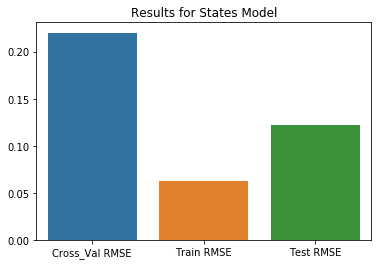

In [145]:
sns.barplot(x=['Cross_Val RMSE',"Train RMSE","Test RMSE"],y=[states_cv_rmse, train_rmse, test_rmse])
plt.title("Results for States Model")

Text(0.5, 1.0, 'Results for County Model')

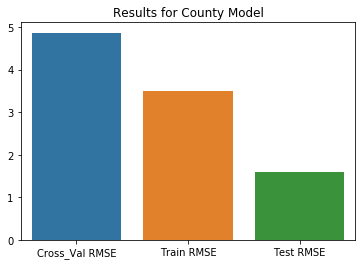

In [146]:
sns.barplot(x=['Cross_Val RMSE',"Train RMSE","Test RMSE"],y=[mean_cv_rmse, train_rmse_county, test_rmse_county])
plt.title("Results for County Model")

# COVID 19 Final Project - Dataset Group B

After exploring the dataset Group A, provided to us for the project, we decided to obtain more datasets relating to COVID-19. We realized that Dataset Group A contained a lot of information, which was specific to the United States, but we wanted to understand the pattern of COVID-19 in different places outside the US. In doing so, we came across a dataset provided by the World Health Organization (WHO), where the WHO classified the transmission of the virus in different countries into 3 categories - Community Transmission, which indicates the highest form of transmission, Clusters of Cases - indicating a medium-level of transmission and Sporadic cases - indicating an extremely low level of spread of the virus. According to WHO, the criteria for this classification is the total number of confirmed coronavirus cases and total number of deaths. We decided to expand this analysis and make this process - automated i.e. make a classification model, which predicts given a certain set of features about a country, the level of transmission in that country. 

Using Dataset Group A, we predicted the total number of deaths for different counties and states, so thereby we extended this to predicting the total number of deaths for different countries.

Descriptions of the different datasets of the Dataset Group B with brief descriptions:<br>
1) all_cases_who.csv - records the level of transmission in the country<br>
https://www.who.int/docs/default-source/coronaviruse/situation-reports/20200502-covid-19-sitrep-103.pdf?sfvrsn=d95e76d8_4 <br>
2) lockdown_info.csv - contains information on how lockdown measures implemented in certain countries<br>
https://www.bsg.ox.ac.uk/research/research-projects/coronavirus-government-response-tracker<br>
https://github.com/OxCGRT/covid-policy-tracker
<br>
3) world_bank.csv - contains information about general mortlaity rates, population and spread of other diseases.<br>
https://data.worldbank.org/indicator/SH.MED.BEDS.ZS
<br>
4) population_density.csv - contains the population density of different countries<br>
https://data.worldbank.org/indicator/EN.POP.DNST
<br>
5) covid-testing-wiki.csv - contaings testing information about various countries
https://en.wikipedia.org/wiki/COVID-19_testing
<br>

This cell loads the data from the all_cases_who.csv file which contains the information, describing the transmission level of the disease COVID-19 in various countries. The Transmission column in this dataset describes the level of transmission of the virus and takes any of the values - "Community transmission", "Clusters of cases", "Sporadic cases" and "Pending". The first three values describe the levels of transmission, with Community transmission being the highest level of transmission, clusters of cases being the level where many cases have occured only in certain geographical regions of the country and sporadic cases indicate very few cases. However, for the countries that the WHO did not have any information about the transmission level, are indicated by "Pending". For the classification model, it was best to drop those rows with Pending transmission levels, because having no information about the transmission level would not be suitable for the model. In addition, the model would not be able to predict whether the country's virus transmission level would be pending, because the transmission level of "Pending" does not follow a particular pattern with other features of the dataset. It is also best to drop the rows with NaN values, especially in the columns of Total Confirmed Cases and Total Deaths, because having those rows would not have a transmission level or even if it does, it raises questions that columns like Total Confirmed Cases or Total Deaths were NaNs, then hows the information for transmission level obtained. 

In [147]:
who_data = pd.read_csv("all_cases_who.csv")
who_data = who_data.dropna()
who_data_final = who_data.query('Transmission != "Pending"')
who_data_final = who_data_final.replace('United States of America', 'United States').replace('The United Kingdom', 'United Kingdom')

The cell below loads the lockdown_info.csv dataset which contains information about the lockdown measures in various countries. Here different indexes are described, such as H2_Testing which describes the level of testing in a particular country. More information about these indexes can be found on https://www.bsg.ox.ac.uk/research/research-projects/coronavirus-government-response-tracker

An important index that this dataset contains is the StringencyIndexForDisplay records the strictness of government measures in terms of implementing policies which enforce restrictions on people movement such as into offices, gatherings etc. This index, however has no contribution of any financial indexes. 

In the process of data cleaning, all dates after the 5th April 2020 were taken, because before that most of the countries had not implemented any lockdown measures. In fact, we even tried filtering it before that date, but it doesnt help our model and does not change the accuracy. In addition, it also contains a lot of NaN values, which if we replaced with 0.0 , would give a wrong impression of the lockdown measure. Moreover, since there are many rows per date, after 5th April, we grouped by all the rows by country and aggregated the values by the maximum, which shows the highest level of any measure that was taken in the country and also the highest StringencyIndex possible, which gives the most complete information about the lockdown measures in that country.

In [148]:
lockdown = pd.read_csv("lockdown_info.csv")
lockdown_filtered = lockdown.rename(columns={"CountryName":"Country"})
lockdown_final = lockdown_filtered.query("Date >= 20200405").groupby("Country").agg("max").reset_index()[["Country", 'CountryCode',
'H2_Testing', 'H3_Contact_tracing', 'StringencyIndexForDisplay']]

The cell below loads the world_bank.csv dataset. This dataset gives vital information such as Death_rate, Smoking Prevalence, TB in the country, Physicians, the Total population etc. These are indicators of the study conducted by the World Bank, thereby they are pivoted by country and these indicators. Then the dataframe is filled with any NaN columns as 0. Here, since these are indicators, we realized the WHO had values for every column, every row, excpet Nurses, Physicians and Net Mirgration, which do not affect the COVID-19 cases as much as population does. Therefore, it would not affect the model as much, therefore replacing them with 0, is an appropriate decision for the cleaning of this particular dataset.

In [149]:
#Loading the entire dataset
world_bank = pd.read_csv("world_bank.csv")
world_bank = world_bank.rename(columns={"Country_Name":"Country", "2018":"Recent"})
world_bank = world_bank[["Country", "Indicator_Name", "Recent"]]
filtered_world_bank = world_bank.query('Indicator_Name == "Population, total"' + 
                            '| Indicator_Name == "Death rate, crude (per 1,000 people)"' + 
                            ' | Indicator_Name == "Physicians (per 1,000 people)"' +
                           ' | Indicator_Name == "Nurses and midwives (per 1,000 people)"' + 
                            ' | Indicator_Name == "Incidence of tuberculosis (per 100,000 people)"' + 
                           '| Indicator_Name == "Smoking prevalence, total (ages 15+)"' + 
                           '| Indicator_Name == "Net migration"')
pivot_all_features_wb = filtered_world_bank.pivot('Country', 'Indicator_Name').reset_index()
world_bank_cleaned = pivot_all_features_wb.fillna(0)
world_bank_final = pd.DataFrame({"Country": world_bank_cleaned.iloc[:, 0], 
                         "Death_Rate":world_bank_cleaned.iloc[:, 1], 
                         "Population":world_bank_cleaned.iloc[:, 6], 
                        "Growth":world_bank_cleaned.iloc[:, 5],
                        "Nurses":world_bank_cleaned.iloc[:, 4],
                        "TB": world_bank_cleaned.iloc[:, 2],
                        "Smoking":world_bank_cleaned.iloc[:, 7],
                        "Migrants":world_bank_cleaned.iloc[:, 3]})

The cell below loads the population density of each country. Here there was no need to drop any NaN rows, since all rows had a population density.

In [150]:
pop_density = pd.read_csv("population_density.csv")
pop_density = pop_density.rename(columns={"Country Name":"Country", "2018":"Recent_pop_density"})[['Country', 
                                                                                                   "Recent_pop_density"]].fillna(0)

The cell below loads the testing data, removes the last row, because that record is a sentence about UN's method of data collection. Also, the numerical values were written with the comma, which were removed and were of type String, hence were converted into int format.

In [151]:
testing_data = pd.read_csv("covid-testing-wiki.csv")
testing_data = testing_data[['Country', 'Tested']]
testing_data = testing_data[:-1]
testing_data['Tested'] = testing_data['Tested'].str.replace(',', '')
testing_data['Tested'] = testing_data['Tested'].astype('int')

The cell below generates color-coded version of the world-map, where every country is marked with a color matching the intensity of its StringencyIndexDisplay. Light yellow indicates the lowest StringencyIndexForDisplay (around 17) and the highest is indicated by purple. There is a scale which is present on the top right corner of the visualization. 

What we can understand from this visualization is that most countries are in the darkish-green to purple range for the StringencyIndexForDisplay as on 5th April 2020. This is important because after this time, a lot of countries saw a surge in the coronavirus cases in their countries, specifically Europe and the United States. However, we saw that not very strigent lockdown measures were in place for countries like US, even though the cases were on a rise. However, in South Asia, the StrigencyIndexForDisplay, as seen in the graph is entirely purple, but not many cases as of yet were seen by then.

The nations marked black, are the ones for which we do not have data.

In [152]:
#Geo pandas visualization
import folium as fd
country_geo = 'world-countries.json'
plot_data = lockdown_final[['CountryCode', 'StringencyIndexForDisplay']]
map_a = fd.Map(location=[20, 0], zoom_start=1.4)
map_a.choropleth(geo_data=country_geo, data=plot_data,
             columns=['CountryCode', 'StringencyIndexForDisplay'],
             key_on="feature.id",
             fill_color='YlGnBu',
             )
map_a

The cell below generates color-coded version of the world-map, where every country is marked as yellow, dark green or purple indicating the levels of Transmission in their countries. Yellow marks the level of Sporadic cases, Dark green marks the level of transmission to be Clusters of Cases and purple marks it being under Community Transmission. 

From the visualization it can be clearly seen that most countries are under level 2 transmission, where there are a lot of cases at one particular region, but there are multiple regions like those. Many of the South American countries, the United States, United Kingdom, Western Europe are under Community Transmission, even then their StringencyIndexForDisplay is not Purple. 

The nations marked black are the ones for whom data is not available.

In [153]:
import folium as fd
country_geo = 'world-countries.json'
lockdown_vis = lockdown.query("Date >= 20200505")
name_to_code = lockdown_vis.query("Date == 20200505")[['CountryName', 'CountryCode']]
who_data_coded = who_data_final.merge(name_to_code, how='left',left_on='Country', right_on='CountryName')
who_data_coded = who_data_coded.dropna()
plot_data = who_data_coded.replace(['Community transmission', 'Clusters of cases', 'Sporadic cases'], [3,2,1])[['CountryCode', 'Transmission']]
map_a = fd.Map(location=[20, 0], zoom_start=1.4)
map_a.choropleth(geo_data=country_geo, data=plot_data,
             columns=['CountryCode', 'Transmission'],
             key_on="feature.id",
             fill_color='YlGnBu',
             nan_fill_color='YlGnBu'
             )
map_a

## Modelling

We have divided our modelling section into 2 models. It is the same classification model, but Version 2 is an improved version of Version 1. We did this, to be able to track the improvement in the second version. 

### Classification Model 1
This is the first model which we created to be able to classify the countries into the 3 categories of Transmission as described at the top. This model also uses testing as a feature. Here, before we one-hot-encode the H2-Testing and H3_Contact_tracing feature, we decided to store its numeric values for our visualizations. Then we have merged all the datasets. 

In the end we also compute a new column, which is the percentage of people that are positive for coronavirus, using the tested column that we had appended earlier.

In [154]:
lockdown_final_1 = lockdown_final.copy()
lockdown_final_1['H2_Testing_Numeric'] = lockdown_final_1['H2_Testing']
lockdown_final_1['H3_Contact_tracing_Numeric'] = lockdown_final_1['H3_Contact_tracing']
lockdown_ohe = lockdown_final_1.replace({'H2_Testing': {1.0:"Minor Testing", 
                           2.0:"Symptotatic", 3.0:"Highest"},
                             'H3_Contact_tracing': {0.0: "No Contact Tracing", 1.0:"Limited", 2.0:"Comprehensive"}})
lockdown_final_1 = ohe_fireplace_qu(lockdown_ohe, ['H2_Testing', 'H3_Contact_tracing'])
merged_with_who = who_data_final.merge(testing_data, on='Country')
merged_who_lockdown_test = merged_with_who.merge(lockdown_final_1, on="Country")
merged_who_lock_wb_test = merged_who_lockdown_test.merge(world_bank_final, on='Country')
merged_all = merged_who_lock_wb_test.merge(pop_density, on='Country')
merged_all['Positive'] = (merged_all['Total_Confirmed'] + merged_all['Total_confirmed_new'] + merged_all['Total_deaths'] + merged_all['Total_new_deaths']) * 100/merged_all['Tested']
merged_all = merged_all.dropna()

#### EDA Visualizations
We are doing EDA here, because we want to utilize the merged_final_1 dataframe which also contains the testing data for each country. This would help us make some decisions about the model. Since the first version of the classification model had the Testing column and the merged_final_1 dataframe was specially configured to allow for this. Therefore, some of the EDA visualizations, that helped us identify features for the Version 1 classification model are shown here. 

Here after combining datasets we are able to obain a better view and can find correlation between many features, therefore the EDA is being done after all datasets were merged.

Text(0.5, 1.0, '% Positive Vs. Confirmed Cases')

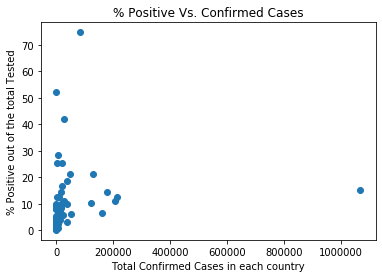

In [155]:
plt.scatter(merged_all['Total_Confirmed'], merged_all['Positive'])
plt.xlabel('Total Confirmed Cases in each country')
plt.ylabel('% Positive out of the total Tested')
plt.title('% Positive Vs. Confirmed Cases')

This plot exhibits the no. of confirmed cases and the positive out of the total tested in every country. It is unusual to not notice a linear pattern in this data.  This may have been due to high testing rate, but not a lot of cases. Also, there are a few outliers, where the cases are high, but percentage of positive is not too high, which means the testing was appropriate and proportional to the no. of confirmed cases.

Text(0.5, 1.0, 'Total Confirmed vs. Total Deaths')

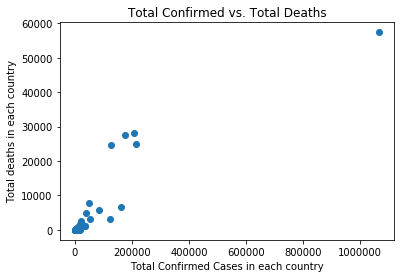

In [156]:
plt.scatter(merged_all['Total_Confirmed'], merged_all['Total_deaths'])
plt.xlabel('Total Confirmed Cases in each country')
plt.ylabel('Total deaths in each country')
plt.title('Total Confirmed vs. Total Deaths')

This plot describes the relationship between the Total confirmed cases and the total deaths. There is almost linear relationship, with one outlier, which we expect to be the United States. These features will be very helpful in predicting the transmission level, because increased cases and deaths correspond to community transmission and so on and so forth.

Text(0.5, 1.0, 'TB vs. Total Confirmed')

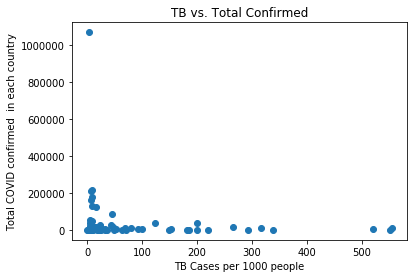

In [157]:
plt.scatter(merged_all['TB'], merged_all['Total_Confirmed'])
plt.xlabel('TB Cases per 1000 people')
plt.ylabel('Total COVID confirmed  in each country')
plt.title('TB vs. Total Confirmed')

The plot between TB and Total_confirmed Cases does not have a trend, but it can help in drawing the classification boundaries and also helps in knowing that these two features are not collinear, which helps in classification. However, as shown later, the outliers in this plot are removed. This might help us argue that COVID-19 and TB does not have a relation, but a lot of concentration of the points in the beginning might be a relevant trend to explore.

Text(0.5, 1.0, 'TB vs. Total Deaths')

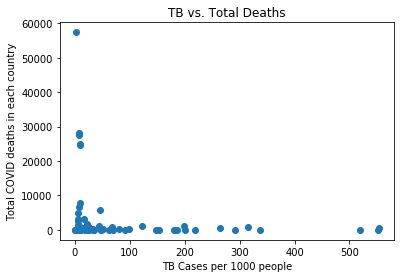

In [158]:
plt.scatter(merged_all['TB'], merged_all['Total_deaths'])
plt.xlabel('TB Cases per 1000 people')
plt.ylabel('Total COVID deaths in each country')
plt.title('TB vs. Total Deaths')

This plot above follows a similar trend between TB and Total Confirmed Cases. It also seems that the outliers are also at the same points. 

Text(0.5, 1.0, 'Testing in Various Transmission Categories')

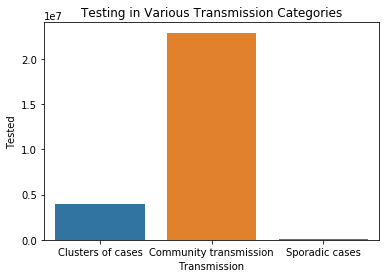

In [159]:
# Plot with different classification and tested data 
plotting_dataframe = merged_all.groupby(['Transmission']).agg('sum').reset_index()
sns.barplot(data = plotting_dataframe, 
            x = 'Transmission', 
            y = 'Tested'
            )
plt.title('Testing in Various Transmission Categories')

In the above plot, it is seen that the countries under Community transmission had the highest amount of testing, followed by Clusters of Cases and then the Sporadic Cases. This is expected, since if the country has a lot of cases spreading, you had want a lot of testing also to be done. 

Text(0.5, 1.0, '% of Positive Cases in Various Transmission Categories')

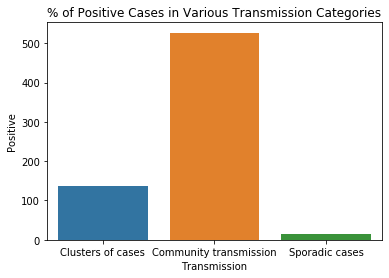

In [160]:
# Plot with different classification and tested data 
plotting_dataframe = merged_all.groupby(['Transmission']).agg('sum').reset_index()
sns.barplot(data = plotting_dataframe, 
            x = 'Transmission', 
            y = 'Positive'
            )
plt.title('% of Positive Cases in Various Transmission Categories')

The above plot shows that community transmission has the highest percentage of positive cases. 

Text(0, 0.5, 'Count')

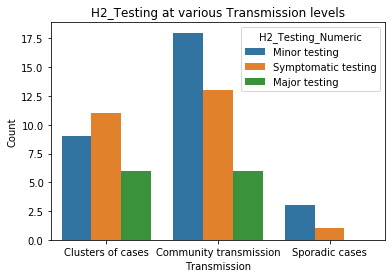

In [161]:
plotting_dataframe = merged_all.groupby(['Transmission', 'H2_Testing_Numeric']).agg('count')
a = plotting_dataframe.reset_index()
a["H2_Testing_Numeric"] = a["H2_Testing_Numeric"].replace(
    1.0,"Minor testing").replace(2.0,"Symptomatic testing").replace(3.0,"Major testing")
sns.barplot(data=a,
             x = 'Transmission',
             y = 'Country',
             hue = 'H2_Testing_Numeric',
           )   
plt.title('H2_Testing at various Transmission levels')
plt.ylabel('Count')

This plot exhibits the different levels of testing in various transmission categories. It is very surprising to see that for community Transmission, Major testing was one of the lowest i.e. very less countries which were Community Transmission were actually doing at a very high level. 

Text(0, 0.5, 'Count')

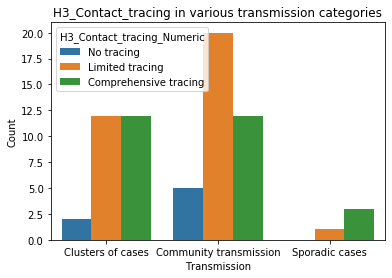

In [162]:
plotting_dataframe = merged_all.groupby(['Transmission', 'H3_Contact_tracing_Numeric']).agg('count')
a = plotting_dataframe.reset_index()
a["H3_Contact_tracing_Numeric"] = a["H3_Contact_tracing_Numeric"].replace(0.0,"No tracing").replace(1.0,"Limited tracing").replace(2.0,"Comprehensive tracing")
sns.barplot(data=a,
            x = 'Transmission',
            y = 'Country',
            hue = 'H3_Contact_tracing_Numeric',
           )   
plt.title('H3_Contact_tracing in various transmission categories')
plt.ylabel('Count')

This plot exhibits the contact tracing in each of the Transmission levels. In the countries classified as Community Transmission, the Contact Tracing is under category 2 i.e. Limited Tracing. This is still better than the level of Testing they are doing. In other transmission categories,for example in countries under sporadic cases their comprehensive tracing is at the highest level, which is what is needed in Community Transmission.

#### Outlier Removal

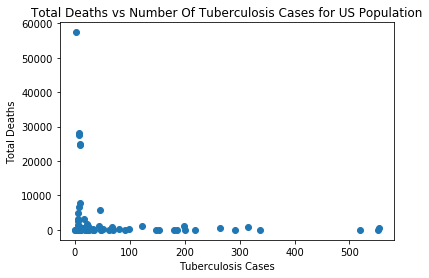

In [163]:
plt.scatter(merged_all['TB'], merged_all['Total_deaths'])
xlabel, ylabel, title = plt.xlabel("Tuberculosis Cases"), plt.ylabel("Total Deaths"),\
    plt.title("Total Deaths vs Number Of Tuberculosis Cases for US Population")

The plot above indicators there is some relation between the no. of COVID-19 deaths and the incidence of TB in the country. Therefore, it was important to remove those records with extremely high deaths, the one above 24000 deaths, because these points proved to b outliers in relation with many other features, therefore it was important to remove them. Due to a strong correlation between TB and Total_deaths, it was important to remove those outliers as well, which were greater than 500, therefore were removed. 

Also, these outliers were outliers in other other correlation plots as well. For example, all outliers having deaths greater than 24000 were outlieres in Confirmed_Cases vs. Total_Deaths, as well as Total_Deaths vs. Positive %. When looked carefully, these countries like Italy, Spain, United States. 

In [164]:
merged_final_1 = merged_all.query('TB < 500').query('Total_deaths < 24000')

In [165]:
who_train, who_test = train_test_split(merged_final_1, test_size=0.25, random_state=100)
random_forest_model = ensemble.RandomForestClassifier(random_state=11, n_estimators=15, min_samples_split=4)
random_forest_model.fit(who_train[['Total_Confirmed',  
                                   'Total_deaths',
                                   'Population', 
                                   'Death_Rate',
                                   'TB',
                                   "Recent_pop_density",
                                   'H2_Testing=Highest',
                                   'H2_Testing=Minor Testing', 
                                   'H2_Testing=Symptotatic', 
                                   'H3_Contact_tracing=Comprehensive',
                                   'H3_Contact_tracing=Limited', 
                                   'H3_Contact_tracing=No Contact Tracing',
                                  ]], who_train['Transmission'])
forests_train_accuracy = accuracy_score(who_train['Transmission'], 
                                        random_forest_model.predict(
                                            who_train[['Total_Confirmed',  
                                                       'Total_deaths',
                                                       'Population', 
                                                       'Death_Rate',
                                                       'TB',
                                                       'Recent_pop_density',
                                                       'H2_Testing=Highest',
                                                       'H2_Testing=Minor Testing', 
                                                       'H2_Testing=Symptotatic', 
                                                       'H3_Contact_tracing=Comprehensive',
                                                       'H3_Contact_tracing=Limited', 
                                                       'H3_Contact_tracing=No Contact Tracing']]))
forests_test_accuracy = accuracy_score(who_test['Transmission'], 
                                       random_forest_model.predict(
                                           who_test[['Total_Confirmed',  
                                                     'Total_deaths',
                                                     'Population', 
                                                     'Death_Rate',
                                                     'TB',
                                                     'Recent_pop_density',
                                                     'H2_Testing=Highest',
                                                     'H2_Testing=Minor Testing', 
                                                     'H2_Testing=Symptotatic', 
                                                     'H3_Contact_tracing=Comprehensive',
                                                     'H3_Contact_tracing=Limited', 
                                                     'H3_Contact_tracing=No Contact Tracing']]))
print("Training Accuracy", forests_train_accuracy)
print("Testing Accuracy", forests_test_accuracy)

Training Accuracy 0.9772727272727273
Testing Accuracy 0.6


This model had a significantly low accuracy given the features. Therefore, to improve we tried removing the feature named 'Positive' from our model and realized that it did not make any difference to our accuracy, i.e. the feature about people being tested and the way the disease is spreading, has no importance. The plot below shows the same conclusion and therefore we decided to remove this feature. In doing so, we realized the total number of rows increased significantly, because when we merged, only did inner-merge, because putting the value of 0 tested in rows with missing tested data would be extremely harmful to our model, so having a certain number of cases cannot be without being tested. So, we removed the 'Positive' feature.

### Classification Model 2 - Improvement from Model 1 

This model is an improvement of the above classification model. This model no longer uses the information about testing in various countries, to classify different countries into the transmission categories, for the reasons outlined above. In fact, we realized it would have been more beneficial to use the feature of StringencyIndexForDisplay, which outlines how stringently measures were implemented in the country for lockdown and restricting people movement.

In [166]:
merged_who_lockdown = who_data_final.merge(lockdown_final, on="Country")
merged_who_lock_wb = merged_who_lockdown.merge(world_bank_final, on='Country')
merged_all = merged_who_lock_wb.merge(pop_density, on='Country')
merged_all = merged_all.dropna()
merged_final_2 = merged_all.query('Total_deaths < 24000').query('TB < 500')

Text(0.5, 1.0, 'Total Confirmed Cases Vs. StringencyIndex')

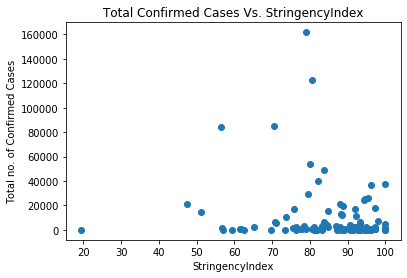

In [167]:
plt.scatter(merged_final_2['StringencyIndexForDisplay'], merged_final_2['Total_Confirmed'])
plt.xlabel('StringencyIndex')
plt.ylabel('Total no. of Confirmed Cases')
plt.title('Total Confirmed Cases Vs. StringencyIndex')

In this plot, for the countries where StringencyIndexForDisplay has been very high, the no. of confirmed cases is very low, almost 0, which means the lockdown measures have worked. Anomalies like those where the cases are 0, but some kind of measures are still implemented shows countries where these measures would have been in place for a long time, or the likelihood of the people getting exposed to the virus would have been very low, due to less people coming into the country.

In [168]:
who_train, who_test = train_test_split(merged_final_2, test_size=0.25, random_state=100)
random_forest_model = ensemble.RandomForestClassifier(random_state=11, n_estimators=15
                                                      , min_samples_split=5)
random_forest_model.fit(who_train[['Total_Confirmed',  
                                   'Total_deaths',
                                   'Population', 
                                   'Death_Rate',
                                   'TB',
                                   'Recent_pop_density',
                                   'StringencyIndexForDisplay']], 
                        who_train['Transmission'])
forests_train_accuracy = accuracy_score(who_train['Transmission'], random_forest_model.predict(
    who_train[['Total_Confirmed', 
               'Total_deaths',
               'Population', 
               'Death_Rate', 
               'TB', 
               'Recent_pop_density',
               'StringencyIndexForDisplay'                   
             ]]))
forests_test_accuracy = accuracy_score(who_test['Transmission'], random_forest_model.predict(
    who_test[['Total_Confirmed',  
              'Total_deaths',
              'Population', 
              'Death_Rate',
              'TB', 
              'Recent_pop_density',
              'StringencyIndexForDisplay'
]]))
print("Training Accuracy:", forests_train_accuracy)
print("Testing Accuracy:", forests_test_accuracy)

Training Accuracy: 0.987012987012987
Testing Accuracy: 0.9230769230769231


In [169]:
Y_hat = random_forest_model.predict(who_test[[
    'Total_Confirmed',  
    'Total_deaths','Population', 
    'Death_Rate',
    'TB', 
    'Recent_pop_density',
    'StringencyIndexForDisplay'
]])
who_test["Prediction"] = Y_hat
Test_Comm_Trans = who_test[who_test["Transmission"] == "Community transmission"]
Pred_Comm_Trans = Test_Comm_Trans[who_test["Prediction"] == "Community transmission"]
num = sum(Test_Comm_Trans["Transmission"] == Test_Comm_Trans["Prediction"])
denom = who_test[who_test["Prediction"] == "Community transmission"]
precision_comm_trans= num/denom.shape[0]
print("Precision for Community Transmission:", precision_comm_trans)                                 

Precision for Community Transmission: 1.0


In [170]:
recall_comm_trans = num/(Test_Comm_Trans.shape[0])
print("Recall for Community Transmission:", recall_comm_trans)

Recall for Community Transmission: 0.9090909090909091


In [171]:
Test_Cluster = who_test[who_test["Transmission"] == "Clusters of cases"]
who_test["Prediction"] = Y_hat
Pred_Cluster = Test_Cluster[who_test["Prediction"] == "Clusters of cases"]
num2 = sum(Test_Cluster["Transmission"] == Test_Cluster["Prediction"])
denom2 = who_test[who_test["Prediction"] == "Clusters of cases"]
precision_cluster= num2/denom2.shape[0]
precision_cluster
print("Precision for Clusters of Cases:", precision_cluster)    


Precision for Clusters of Cases: 0.8666666666666667


In [172]:
recall_cluster = num2/(Test_Cluster.shape[0])
print("Recall for Clusters of Cases: ", recall_cluster)


Recall for Clusters of Cases:  1.0


In [173]:
Test_Sporadic = who_test[who_test["Transmission"] == "Sporadic cases"]
who_test["Prediction"] = Y_hat
Pred_Sporadic = Test_Sporadic[who_test["Prediction"] == "Sporadic cases"]
num3 = sum(Test_Sporadic["Transmission"] == Test_Sporadic["Prediction"])
denom3 = who_test[who_test["Prediction"] == "Sporadic cases"]
precision_sporadic= num3/denom3.shape[0]
print("Precision for Sporadic Cases:", precision_sporadic)


Precision for Sporadic Cases: 1.0


In [174]:
recall_sporadic = num3/(Test_Sporadic.shape[0])
print("Recall for Sporadic Cases: ", recall_sporadic)


Recall for Sporadic Cases:  0.5


Text(0, 0.5, 'Recall')

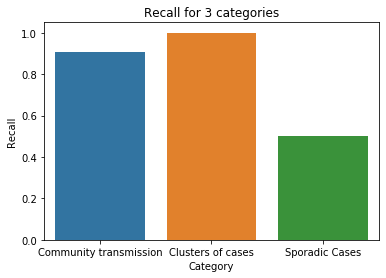

In [175]:
recall = [recall_comm_trans,recall_cluster,recall_sporadic]
recall_df = pd.DataFrame(["Community transmission","Clusters of cases","Sporadic Cases"],recall).reset_index()
sns.barplot(data=recall_df,x = 0,
            y = 'index')
plt.title("Recall for 3 categories")
plt.xlabel("Category")
plt.ylabel("Recall")

Text(0, 0.5, 'Precision')

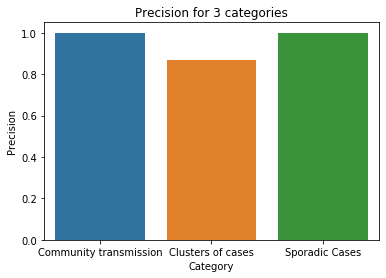

In [176]:
precision = [precision_comm_trans,precision_cluster,precision_sporadic]
precision_df = pd.DataFrame(["Community transmission","Clusters of cases","Sporadic Cases"],precision).reset_index()
sns.barplot(data=precision_df,x = 0,
            y = 'index')
plt.title("Precision for 3 categories")
plt.xlabel("Category")
plt.ylabel("Precision")

#### Conclusion of Project


Please refer to PDF report for conclusion of each of these models and the overall project.
